# GO Enrichment Analysis

Running a GO enrichment analysis for Microscopium. This is carried out in Python 2 with a copy of goatools installed from the source. This works best as there's still a few compatibility issues between goaltools useful utility functions and Python 3.

First import all the dependencies we'll need.

In [1]:
%matplotlib inline

from __future__ import print_function

import os
import wget
import gzip
import pandas as pd
import numpy as np
import sys
from StringIO import StringIO

import pymongo

from datetime import datetime

from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, MDS
from sklearn.metrics import pairwise_distances

from goatools.obo_parser import GODag
from goatools.go_enrichment import GOEnrichmentStudy
from goatools.associations import read_ncbi_gene2go
from goatools.godag_plot import plot_gos, plot_results, plot_goid2goobj

import matplotlib.pyplot as plt
import matplotlib.pylab as pylab

from IPython.core.display import Image 

Download ontologies and associations.

In [2]:
# download ontologies
if not os.path.exists("go-basic.obo"):
    wget.download("http://geneontology.org/ontology/go-basic.obo")
    
# download associations
if not os.path.isfile("gene2go"):
    wget.download("ftp://ftp.ncbi.nlm.nih.gov/gene/DATA/gene2go.gz")

    with gzip.open("gene2go.gz", 'rb') as zstrm:
        with  open("gene2go", 'w') as ostrm:
            ostrm.write(zstrm.read())
    os.remove("gene2go.gz")
    
# load ontologies
obodag = GODag("go-basic.obo")

# load associations
geneid2gos_human = read_ncbi_gene2go("gene2go", taxids=[9606])

load obo file go-basic.obo


go-basic.obo: format-version(1.2) data-version(releases/2016-03-12)


46237 nodes imported


Load the background -- all the genes from the study. Load this from the annotation file as it's got the entrez gene IDs

In [3]:
# genes belonging to the septin family (ie SEPT genes) annoyingly are parsed as dates by Excel
# this function ensures this doesn't happen
def fix_date_target(target):
    if type(target) == datetime:
        year = str(target.year)
        suffix = year[-2:].lstrip("0")
        name = "SEPT" + suffix
        return name
    else:
        return target
    
keefe_annot = pd.read_excel("./KeefeAnnotationFile-12011-12_14_19-22.xlsx",
                            converters={ "entrez.gene.name": fix_date_target })

# load the entrez gene IDs that aren't positive or negative controls
background = keefe_annot[~keefe_annot["description"].isin(["poscontr", "negcontr"])]

# we now have the background genes as entrez gene IDs or entrez gene names! yay!
background = background[["entrez.gene.ID", "entrez.gene.name"]]

Now load the set of image features.

In [4]:
# load the CSV and save a list of the feature names
keefe_features = pd.read_csv("./KEEFE-new.csv", index_col=0)
feature_cols = keefe_features.columns

# only want sample IDs that aren't controls or empty wells
client = pymongo.MongoClient("localhost", 27017)
db_samples = client["microscopium"]["samples"]
sample_ids = db_samples.find({
        "screen": "KEEFE",
        "control_pos": False,
        "control_neg": False,
        "empty": False
    }, projection={
        "_id": True,
        "gene_name": True
    }).sort([("_id", pymongo.ASCENDING)])

keefe_ids = pd.DataFrame(list(sample_ids))

# get the feature vectors we're interested in, and apply a standard scale
feature_active = keefe_features.loc[keefe_ids["_id"]]
feature_active_scale = StandardScaler().fit_transform(feature_active)

Create dimension reduced spaces - PCA, TSNE, the two amigos.

In [5]:
pca_2 = PCA(n_components=2)
pca_50 = PCA(n_components=50)
# init the TSNE object with a random state because
# we like reproducibility. choose 42 because I am unoriginal
tsne_2 = TSNE(n_components=2, random_state=42)

data_pca = pca_2.fit_transform(feature_active_scale)
data_pca_50 = pca_50.fit_transform(feature_active_scale)
data_tsne = tsne_2.fit_transform(data_pca_50)

Now do some clustering in these spaces!

We'll try over a few different ranges.

In [6]:
def cluster_plots(data, k_start, step):
    plt.figure(figsize=(16, 12))

    for idx, k in enumerate(range(k_start, k_start + 6 * step, step)):
        cluster = AgglomerativeClustering(n_clusters=k, linkage="ward").fit(data)

        plt.subplot(230 + idx + 1)
        plt.scatter(data[:, 0], data[:, 1], c=cluster.labels_)
        plt.title("K = {0}".format(k))

    plt.show()

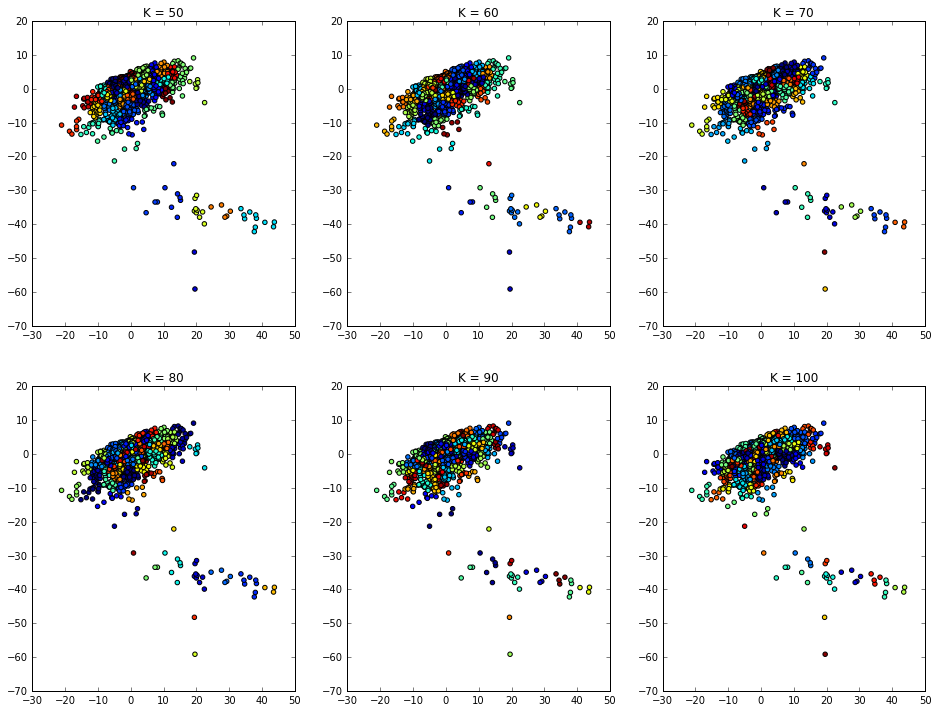

In [7]:
cluster_plots(data_pca, 50, 10)

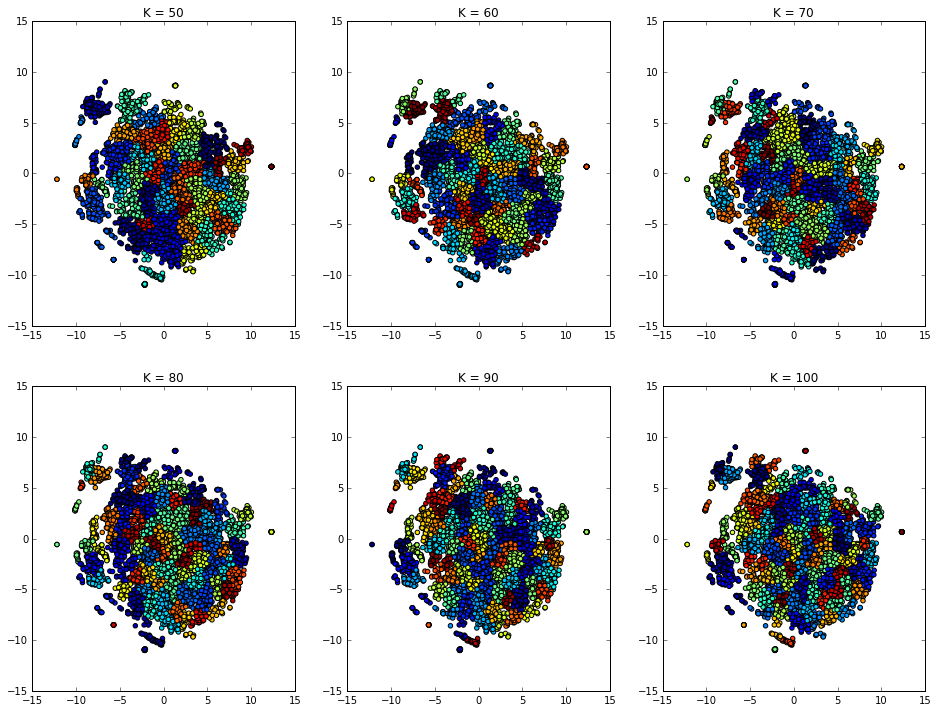

In [8]:
cluster_plots(data_tsne, 50, 10)

I'm pretty satisfied that Agglomerative Clustering with Ward Linkage does a reasonable job of clustering in both reduced spaces. 

Now try some enrichment analysis!

In [9]:
# create the goatools object
goeaobj = GOEnrichmentStudy(
        list(background["entrez.gene.ID"]), # List of genes from study, the background
        geneid2gos_human, # geneid/GO associations
        obodag, # Ontologies
        propagate_counts = False,
        alpha = 0.05, # default significance cut-off
        methods = ['fdr_bh']) # defult multipletest correction method

 2,206 out of  2,235 population items found in association


## Go Analysis With TSNE

I tried the analysis across the range k = 30, .. , 100 and the results were the same each time -- one single cluster with significant terms. Here the results are given for k = 50

In [10]:
k_clusters = 50

ag_clustering = AgglomerativeClustering(n_clusters=k_clusters, affinity="euclidean", linkage="ward")
tsne_k = ag_clustering.fit(data_tsne)

In [11]:
# run an enrichment for every cluster. I tried to suppress the output from running the analysis but 
# there's no verbosity setting :(

for i in range(0, k_clusters):
    cluster_members = list(feature_active[tsne_k.labels_ == i].index)
    cluster_genes = keefe_ids[keefe_ids["_id"].isin(cluster_members)]["gene_name"]
    cluster_gene_list = list(background[background["entrez.gene.name"].isin(cluster_genes)]["entrez.gene.ID"])
    
    goea_results_all = goeaobj.run_study(cluster_gene_list)
    goea_results_sig = [r for r in goea_results_all if r.p_fdr_bh < 0.05]
        
    # some terms such as GO:0005515 (molecular function protein binding) will turn up every single time
    # so we only want to see significant results where there's more than 1 singificant GO term
    
    if len(goea_results_sig) > 1:    
        print("Cluster: {0}".format(i))
        print(goea_results_sig)
        print("")

Calculating uncorrected p-values using Fisher's exact test
   129 out of    137 study items found in association
Running multitest correction: statsmodels fdr_bh
8,224 GO terms are associated with 129 of 137 study items in a population of 2,235
Calculating uncorrected p-values using Fisher's exact test
   103 out of    104 study items found in association
Running multitest correction: statsmodels fdr_bh
8,224 GO terms are associated with 103 of 104 study items in a population of 2,235
Calculating uncorrected p-values using Fisher's exact test
   124 out of    125 study items found in association
Running multitest correction: statsmodels fdr_bh
8,224 GO terms are associated with 124 of 125 study items in a population of 2,235
Calculating uncorrected p-values using Fisher's exact test
   161 out of    163 study items found in association
Running multitest correction: statsmodels fdr_bh
8,224 GO terms are associated with 161 of 163 study items in a population of 2,235
Calculating uncorrec

Cluster 49 looks interesting! There's a few significant terms in there. These are based on uncorrected p-values however, so we should only focus on terms that are significant after correction for multiple testing.

In [12]:
cluster_of_interest = 49

cluster_members = list(feature_active[tsne_k.labels_ == cluster_of_interest].index)
cluster_genes = keefe_ids[keefe_ids["_id"].isin(cluster_members)]["gene_name"]
cluster_gene_list = list(background[background["entrez.gene.name"].isin(cluster_genes)]["entrez.gene.ID"])

goea_results_all = goeaobj.run_study(cluster_gene_list)
# only want significant results
goea_results_sig = [r for r in goea_results_all if r.p_fdr_bh < 0.05]

Calculating uncorrected p-values using Fisher's exact test
    23 out of     23 study items found in association
Running multitest correction: statsmodels fdr_bh
8,224 GO terms are associated with 23 of 23 study items in a population of 2,235


In [13]:
cluster_genes

125        RAN
240       PPA1
276       PPAN
445        RAN
596       PPAN
646       CCT5
904      DDX24
966       CCT5
1001      MPST
1113      KAT8
1344    EIF2S3
1423     DDX23
1572     CCT6A
1664    EIF2S3
1724    NMNAT3
1801    POLR1B
1892     CCT6A
1931      CA14
3240     PSMC1
3313     RPL28
3485      RPL4
3486     RPS23
3633     RPL28
3805      RPL4
3806     RPS23
3901     RPL21
3947     RPL14
3990     RPL23
3999     SPEF1
4139      RPS3
4221     RPL21
4241        IK
4267     RPL14
4459      RPS3
Name: gene_name, dtype: object

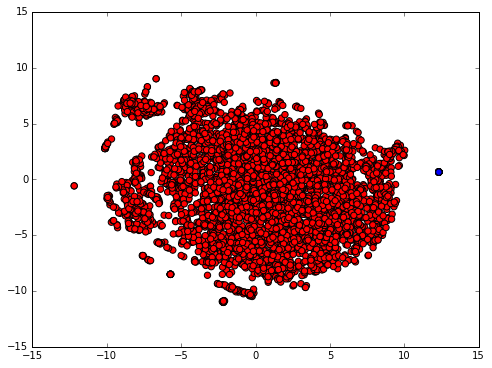

In [14]:
def show_cluster(cluster_of_interest, labels, data):
    colours = ["blue" if label==cluster_of_interest else "red" for label in labels]
    plt.figure(figsize=(8, 6))
    plt.scatter(data[:, 0], data[:, 1], c=colours, s=40)
    plt.show()

show_cluster(49, tsne_k.labels_, data_tsne)

These genes tightly cluster together on the right hand side of this plot.

Looking at these genes in the UI shows they're the ones that clustered together with the positive controls!

In [15]:
# Create GO DAGs -- double click on the image to zoom in if the preview is too small

plot_results("tsne_49_{NS}.png", goea_results_sig)

Couldn't import dot_parser, loading of dot files will not be possible.
  WROTE: tsne_49_CC.png
  WROTE: tsne_49_MF.png
  WROTE: tsne_49_BP.png


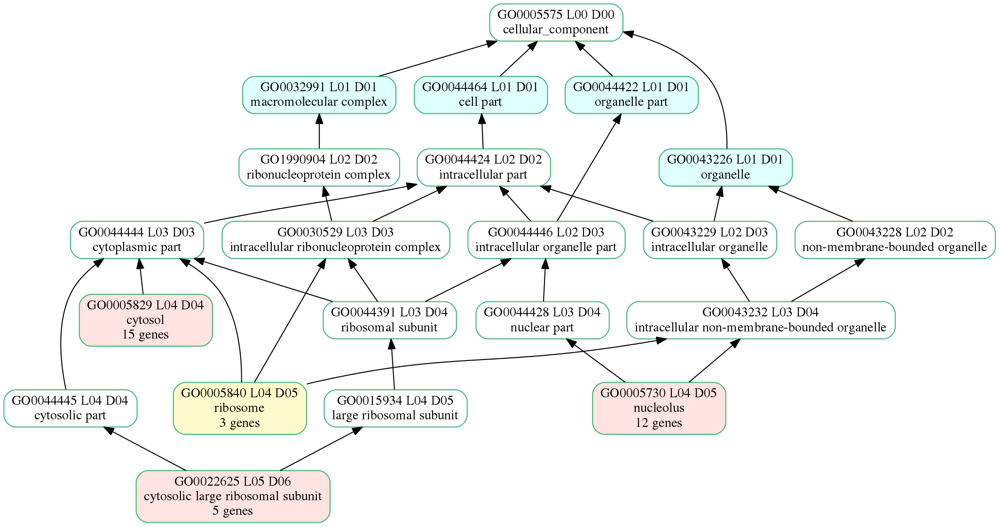

In [16]:
Image("tsne_49_CC.png")

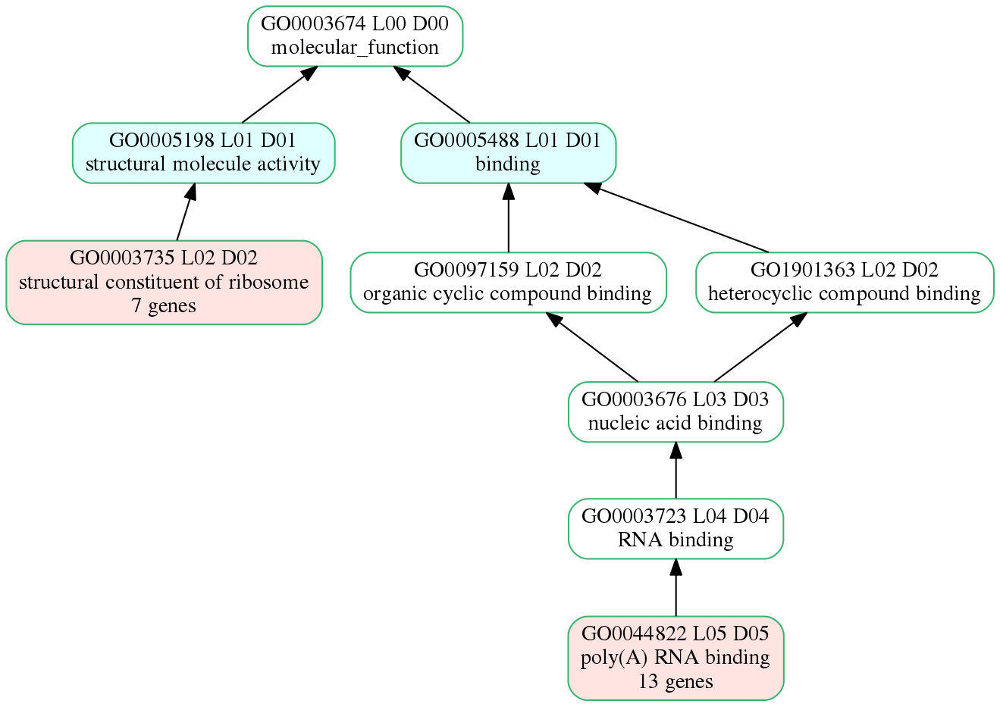

In [17]:
Image("tsne_49_MF.png")

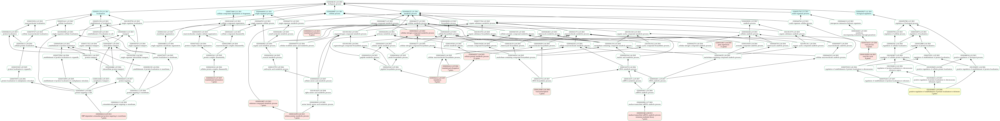

In [18]:
# the plot of biological processes will probably be huge, Juypyter should let you zoom in by double clicking
Image("tsne_49_BP.png")

## Go Anlysis With PCA

Now let's try the same thing with the PCA embedding. I tried the analysis across the range k = 30, ..., 100.. It was the same in most cases (two clusters with GO terms, as discussed below).

In [36]:
k_clusters = 30

ag_clustering = AgglomerativeClustering(n_clusters=k_clusters, affinity="euclidean", linkage="ward")
pca_k = ag_clustering.fit(data_pca)

In [37]:
for i in range(0, k_clusters):
    cluster_members = list(feature_active[pca_k.labels_ == i].index)
    cluster_genes = keefe_ids[keefe_ids["_id"].isin(cluster_members)]["gene_name"]
    cluster_gene_list = list(background[background["entrez.gene.name"].isin(cluster_genes)]["entrez.gene.ID"])
    
    goea_results_all = goeaobj.run_study(cluster_gene_list)
    goea_results_sig = [r for r in goea_results_all if r.p_fdr_bh < 0.05]
        
    # some terms such as GO:0005515 (molecular function protein binding) will turn up every single time
    # so we only want to know when there's more than 1 result
    
    if len(goea_results_sig) > 1:    
        print("Cluster: {0}".format(i))
        print(goea_results_sig)
        print("")

Calculating uncorrected p-values using Fisher's exact test
   403 out of    410 study items found in association
Running multitest correction: statsmodels fdr_bh
8,224 GO terms are associated with 403 of 410 study items in a population of 2,235
Calculating uncorrected p-values using Fisher's exact test
   384 out of    386 study items found in association
Running multitest correction: statsmodels fdr_bh
8,224 GO terms are associated with 384 of 386 study items in a population of 2,235
Calculating uncorrected p-values using Fisher's exact test
   443 out of    446 study items found in association
Running multitest correction: statsmodels fdr_bh
8,224 GO terms are associated with 443 of 446 study items in a population of 2,235
Calculating uncorrected p-values using Fisher's exact test
    40 out of     40 study items found in association
Running multitest correction: statsmodels fdr_bh
8,224 GO terms are associated with 40 of 40 study items in a population of 2,235
Calculating uncorrecte

Clusters 4 and 17 look interesting.

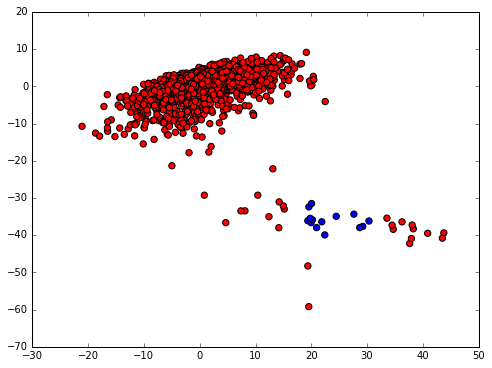

In [38]:
show_cluster(4, pca_k.labels_, data_pca)

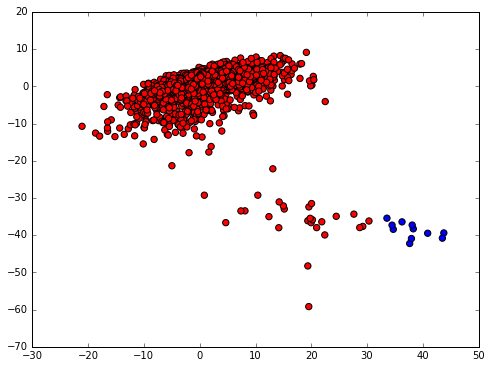

In [22]:
show_cluster(17, pca_k.labels_, data_pca)

In [39]:
# get the lists of genes for each cluster

cluster_4 = list(feature_active[pca_k.labels_ == 4].index)
cluster_17 = list(feature_active[pca_k.labels_ == 17].index)

genes_4 = keefe_ids[keefe_ids["_id"].isin(cluster_4)]["gene_name"]
genes_17 = keefe_ids[keefe_ids["_id"].isin(cluster_17)]["gene_name"]

ids_4 = list(background[background["entrez.gene.name"].isin(genes_4)]["entrez.gene.ID"])
ids_17 = list(background[background["entrez.gene.name"].isin(genes_17)]["entrez.gene.ID"])

In [40]:
genes_4

240       PPA1
276       PPAN
596       PPAN
966       CCT5
1423     DDX23
1801    POLR1B
1892     CCT6A
1931      CA14
3485      RPL4
3486     RPS23
3805      RPL4
3806     RPS23
4267     RPL14
4459      RPS3
Name: gene_name, dtype: object

In [41]:
genes_17

646       CCT5
904      DDX24
1572     CCT6A
1664    EIF2S3
3313     RPL28
3633     RPL28
3901     RPL21
3990     RPL23
3999     SPEF1
4139      RPS3
4221     RPL21
Name: gene_name, dtype: object

Looking at the list of genes, they're the same ones that were found in the TSNE plot. They just clustered more tightly together in TSNE (makes sense too!). 

Now just produce the GO DAGs for each of these clusters. These will probably both be similar to the ones found in TSNE given the same pathway is being affected.

In [42]:
goea_results_all = goeaobj.run_study(ids_4)
goea_results_sig = [r for r in goea_results_all if r.p_fdr_bh < 0.05]

Calculating uncorrected p-values using Fisher's exact test
    11 out of     11 study items found in association
Running multitest correction: statsmodels fdr_bh
8,224 GO terms are associated with 11 of 11 study items in a population of 2,235


In [43]:
plot_results("pca_4_{NS}.png", goea_results_sig)

  WROTE: pca_4_CC.png
  WROTE: pca_4_MF.png
  WROTE: pca_4_BP.png


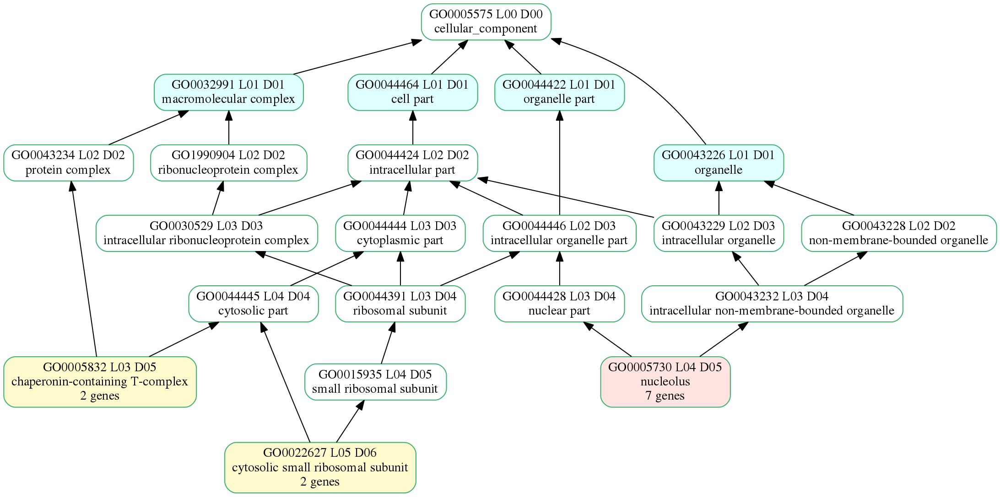

In [44]:
Image("pca_4_CC.png")

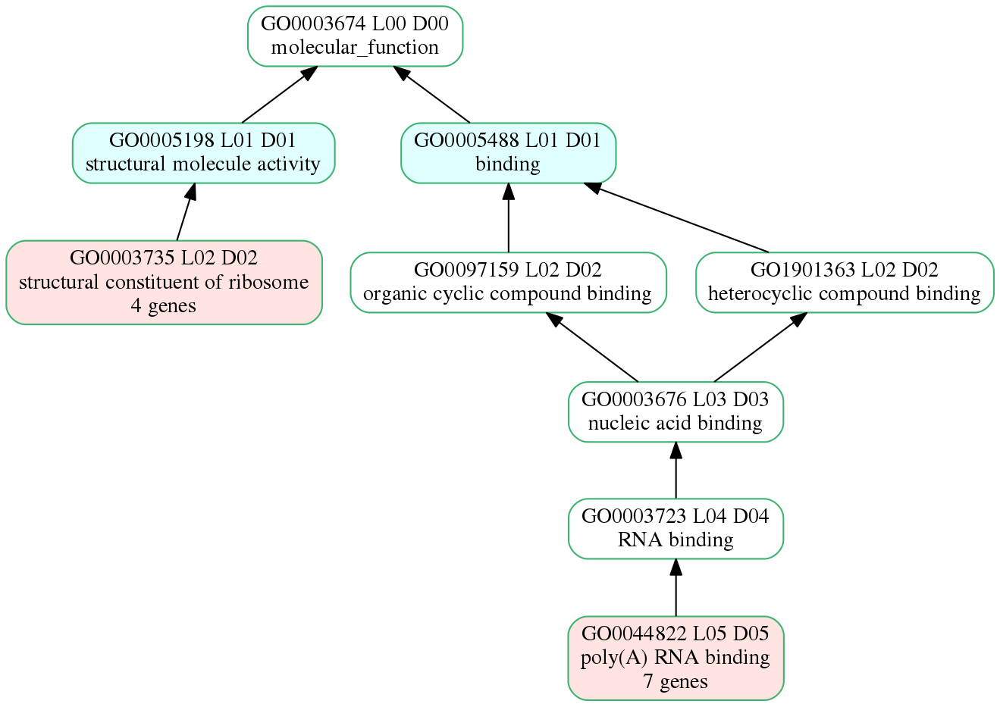

In [45]:
Image("pca_4_MF.png")

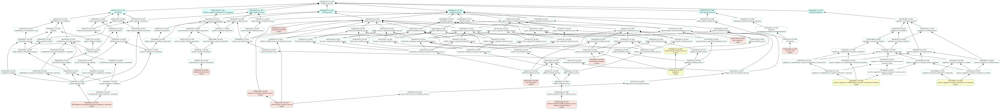

In [46]:
Image("pca_4_BP.png")

In [47]:
goea_results_all = goeaobj.run_study(ids_17)
goea_results_sig = [r for r in goea_results_all if r.p_fdr_bh < 0.05]

Calculating uncorrected p-values using Fisher's exact test
     9 out of      9 study items found in association
Running multitest correction: statsmodels fdr_bh
8,224 GO terms are associated with 9 of 9 study items in a population of 2,235


In [48]:
plot_results("pca_17_{NS}.png", goea_results_sig)

  WROTE: pca_17_CC.png
  WROTE: pca_17_MF.png
  WROTE: pca_17_BP.png


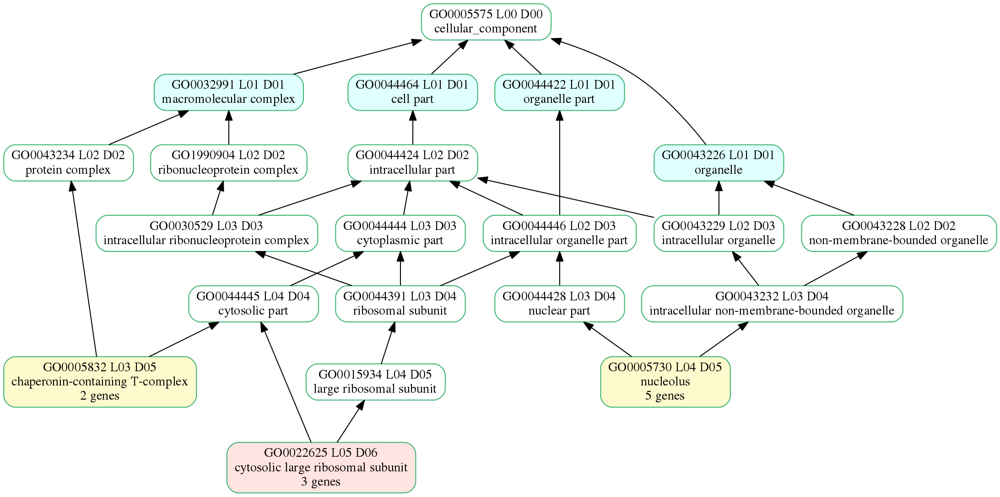

In [49]:
Image("pca_17_CC.png")

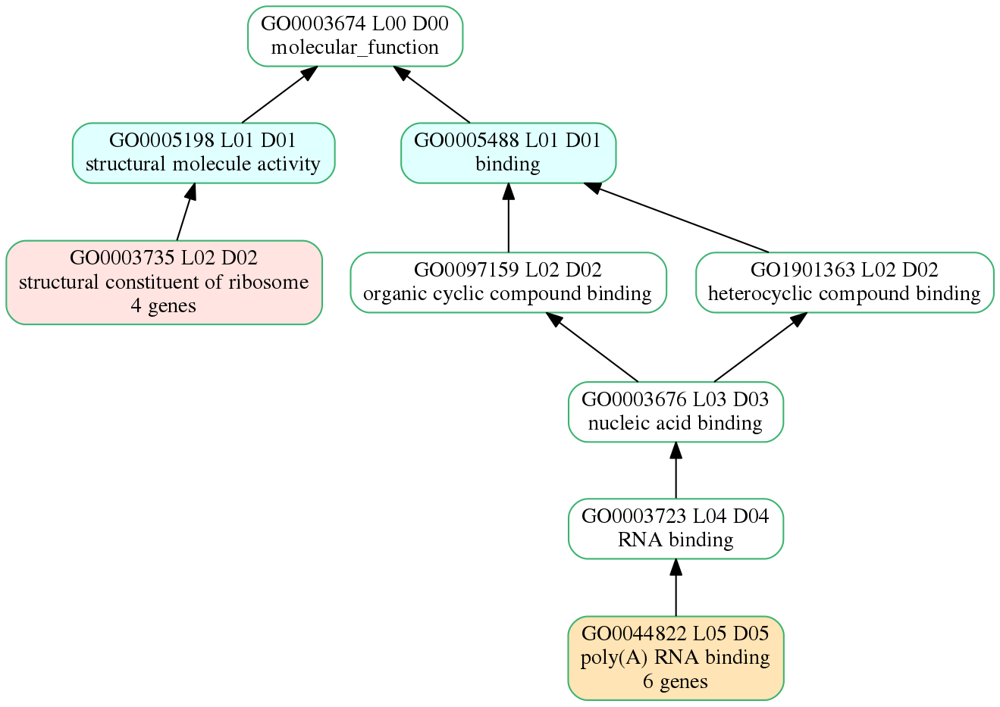

In [50]:
Image("pca_17_MF.png")

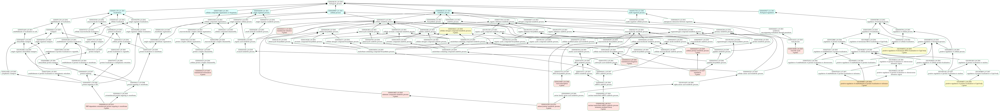

In [51]:
Image("pca_17_BP.png")

Yup, we get the same GO terms!

## Concluding Remarks

There is evidence to suggest that the clusters are biologically relevant.
The cluster with significant GO terms in both cases correspond to genes that clustered together with the positive controls. 
PCA and TSNE produce more or less the same cluster with enriched GO terms.

Oustanding questions:
* Are these results reproducible with random subsets of features?
* How does keeping the control samples affect the results?